# **Neural Style Transfer**

**Objective:** Implement the NST algorithm from *Gatys et al. (2015)* to merge a content image (e.g., the Louvre Museum) with a style image (e.g., a Monet painting) using a pretrained convolutional neural network (CNN), VGG-19.

**Key Components:**
- **Content Cost:** Measures how well the generated image preserves the content of the content image using activations from a middle layer of VGG-19.
- **Style Cost:** Quantifies how well the generated image captures the style of the style image using Gram matrices from multiple VGG-19 layers.
- **Total Cost:** Combines content and style costs with weights (alpha and beta) to optimize the generated image’s pixels directly.
- **Optimization:** Uses gradient descent to update pixel values, not network weights, which is a unique twist compared to typical deep learning tasks.

**Process:** Loads a pretrained VGG-19, computes content and style costs, and iteratively optimizes a generated image starting from random noise or the content image.

**Output:** Generates an artistic image, with examples like the Louvre in Monet’s style, and provides options to test custom images.

----
## 1. Setup and Dependencies

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [6]:
device

'cuda'

### **Details:**

- `torchvision.models` provides pretrained models like VGG-19.
- `transforms` will preprocess images to match VGG-19’s expected input (normalized RGB, 224x224).
- We use CUDA if available for faster computation.

---
## 2. Load and Preprocess Images
**NST** requires a content image (C), a style image (S), and an initial generated image (G). We’ll load these, resize them, and convert them to tensors suitable for VGG-19.

In [ ]:
# Image size
imsize = 400

# Image preprocessing
loader = transforms.Compose([
    transforms.Resize((imsize, imsize)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = loader(image).unsqueeze(0)  # Add batch dimension
    return image.to(device)

# Load images
content_img = load_image("images/louvre_small.jpg")
style_img = load_image("images/monet.jpg")
generated_img = content_img.clone().requires_grad_(True)  # Start with content image, enable gradient

# Function to convert tensor back to image for display
def tensor_to_image(tensor):
    image = tensor.cpu().clone().detach().squeeze(0)
    image = transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1/0.229, 1/0.224, 1/0.225])(image)
    image = image.clamp(0, 1)
    return transforms.ToPILImage()(image)

**Details:**

- **VGG-19** expects images normalized with ImageNet stats (mean and std).
- `generated_img` starts as a copy of `content_img` and requires gradients for optimization.
- `tensor_to_image` reverses normalization for visualization.

Text(0.5, 1.0, 'Content Image')

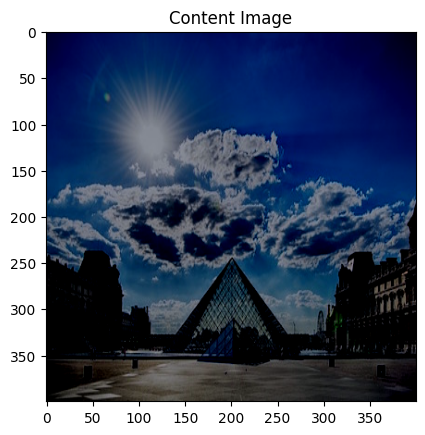

In [8]:
vis_content_img = tensor_to_image(content_img)
plt.imshow(vis_content_img)
plt.title(f"Content Image")

Text(0.5, 1.0, 'Style Image')

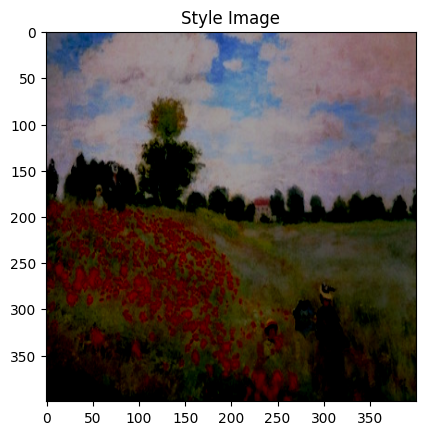

In [9]:
vis_style_img = tensor_to_image(style_img)
plt.imshow(vis_style_img)
plt.title(f"Style Image")

----
## 3. Load Pretrained VGG-19 Model

In [10]:
# Load VGG-19 without the classifier head
vgg = models.vgg19(pretrained=True).features.to(device).eval()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:09<00:00, 59.7MB/s]


In [11]:
# Freeze parameters
for param in vgg.parameters():
    param.requires_grad = False

# Define layers for content and style
content_layers = ['conv_4_2']  # Block 4, conv 2 (middle layer)
style_layers = ['conv_1_1', 'conv_2_1', 'conv_3_1', 'conv_4_1', 'conv_5_1']  # Multiple layers for style

# Mapping layer names to VGG-19 indices
layer_names = {
    '0': 'conv_1_1', '5': 'conv_2_1', '10': 'conv_3_1', '19': 'conv_4_1', '21': 'conv_4_2', '28': 'conv_5_1'
}

In [12]:
# Custom model to get activations from specific layers
class VGGFeatures(nn.Module):
    def __init__(self, vgg, layer_names):
        super(VGGFeatures, self).__init__()
        self.vgg = vgg
        self.layer_names = layer_names
        self.outputs = {}

    def forward(self, x):
        self.outputs = {}
        for name, module in self.vgg._modules.items():
            x = module(x)
            if name in self.layer_names:
                self.outputs[layer_names[name]] = x
        return x

In [13]:
# Instantiate feature extractor
content_extractor = VGGFeatures(vgg, {k: v for k, v in layer_names.items() if v in content_layers})
style_extractor = VGGFeatures(vgg, {k: v for k, v in layer_names.items() if v in style_layers})

**Details:**

- `vgg19(pretrained=True).features` gives us the convolutional layers.
- `.eval()` sets the model to inference mode; no dropout or batch norm updates.
- We define `content_layers` **(one middle layer)** and `style_layers` **(multiple layers)** .
- `VGGFeatures` is a custom module to capture activations at specified layers

----
## 4. Define Cost Functions
NST optimizes a total cost, $$J(G) = α * J\_content(C, G) + β * J\_style(S, G)$$.

We compute:
- **Content Cost:** Mean squared error between content and generated image activations at a single layer.
$$J_{content}(C,G) =  \frac{1}{4 \times n_H \times n_W \times n_C}\sum _{ \text{all entries}} (a^{(C)} - a^{(G)})^2 $$

- **Style Cost:** Sum of MSE between Gram matrices of style and generated image activations across multiple layers.
$$J_{style}^{[l]}(S,G) = \frac{1}{4 \times {n_C}^2 \times (n_H \times n_W)^2} \sum _{i=1}^{n_C}\sum_{j=1}^{n_C}(G^{(S)}_{(gram)i,j} - G^{(G)}_{(gram)i,j})^2 $$


### 4.1 Content Cost Function

In [14]:
# Content cost function
def compute_content_cost(a_C, a_G):
    m, n_H, n_W, n_C = a_G.size()
    return torch.sum((a_C - a_G) ** 2) / (4 * n_H * n_W * n_C)

### 4.2 Style Cost Function

**Gram matrices**
* The style matrix is also called a "Gram matrix."
* You will compute the Gram matrix by multiplying the "unrolled" filter matrix with its transpose:

<img src="images/NST_GM.png" style="width:900px;height:300px;">

$$\mathbf{G}_{gram} = \mathbf{A}_{unrolled} \mathbf{A}_{unrolled}^T$$

In [15]:
# Gram matrix for style
def gram_matrix(A):
    m, n_H, n_W, n_C = A.size()
    A = A.view(n_H * n_W, n_C)
    G = torch.mm(A.t(), A)
    return G / (n_H * n_W * n_C)

In [16]:
# Style cost function
def compute_style_cost(a_S_layers, a_G_layers, style_weights):
    style_cost = 0
    for layer in style_layers:
        a_S = a_S_layers[layer]
        a_G = a_G_layers[layer]
        m, n_H, n_W, n_C = a_G.size()
        G_S = gram_matrix(a_S)
        G_G = gram_matrix(a_G)
        layer_cost = torch.sum((G_S - G_G) ** 2) / (4 * (n_H * n_W * n_C) ** 2)
        style_cost += style_weights[layer] * layer_cost
    return style_cost

In [17]:
# Hyperparameters
alpha = 10  # Content weight
beta = 40   # Style weight
style_weights = {layer: 1.0 / len(style_layers) for layer in style_layers}  # Equal weighting

**Details:**

- **Content Cost:** Normalizes by feature map size to ensure scale invariance.
- **Gram Matrix:** Captures feature correlations, flattened to (channels, channels) matrix.
- **Style Cost:** Aggregates costs across layers, weighted equally here (adjustable).
- `alpha` and `beta` balance content and style; tweak these for different effects.

---
## 5. Total Cost and Optimization

In [18]:
optimizer = optim.Adam([generated_img], lr=0.01)

In [19]:
# Precompute content and style features
content_extractor(content_img)
content_features = content_extractor.outputs

style_extractor(style_img)
style_features = style_extractor.outputs

Epoch 0, Total Cost: 0.0000


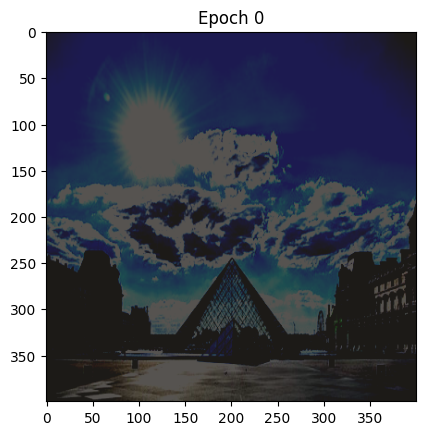

Epoch 1000, Total Cost: 0.0980


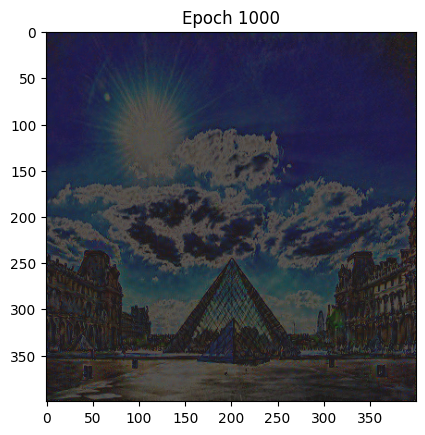

Epoch 2000, Total Cost: 0.0598


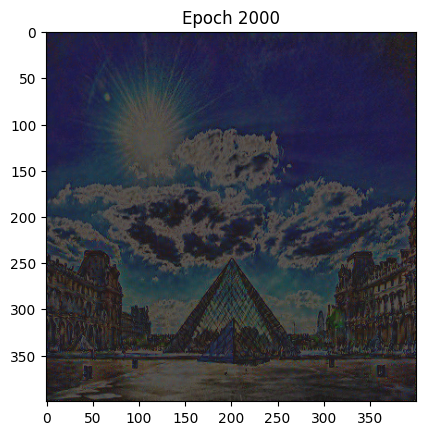

Epoch 3000, Total Cost: 0.0453


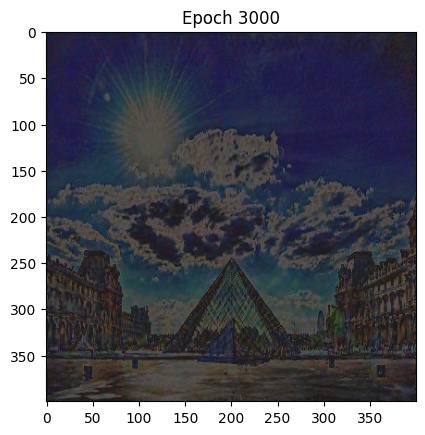

Epoch 4000, Total Cost: 0.0432


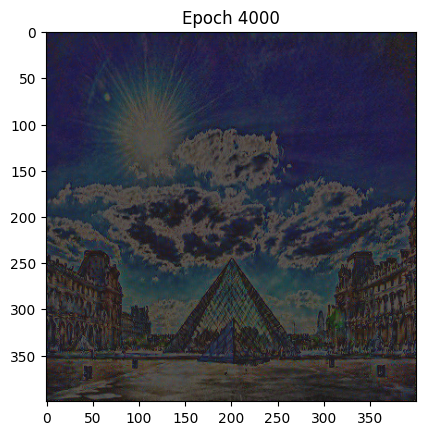

Epoch 5000, Total Cost: 0.0336


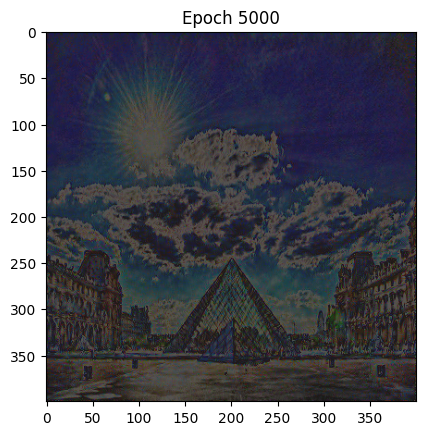

Epoch 6000, Total Cost: 0.0326


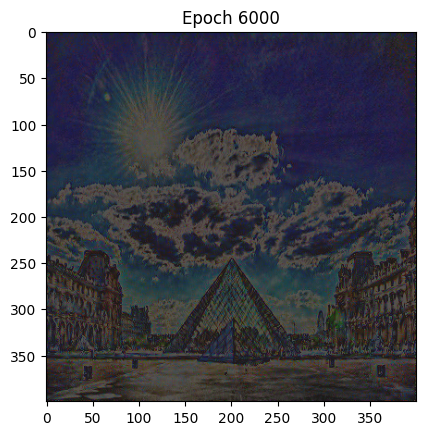

Epoch 7000, Total Cost: 0.0305


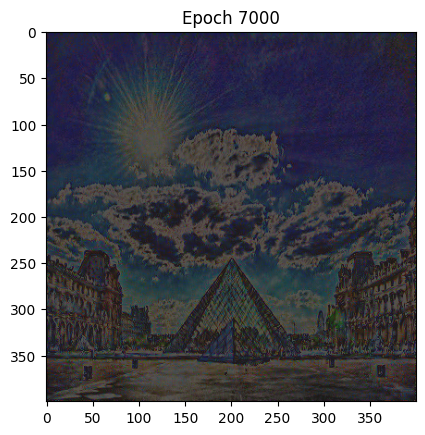

Epoch 8000, Total Cost: 0.0293


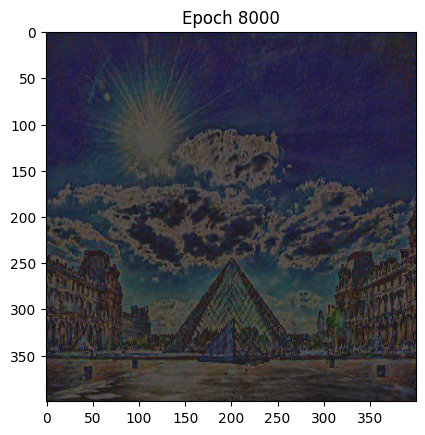

Epoch 9000, Total Cost: 0.0275


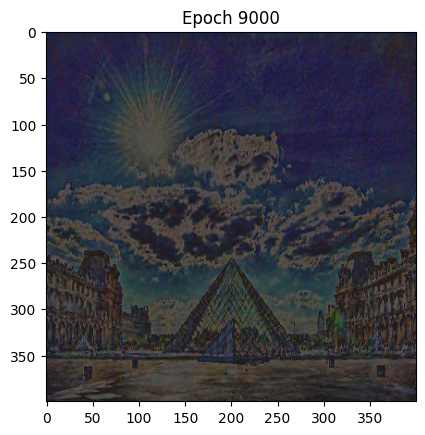

Epoch 10000, Total Cost: 0.0278


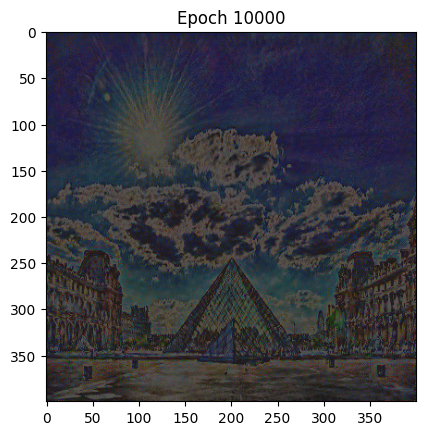

Epoch 11000, Total Cost: 0.0259


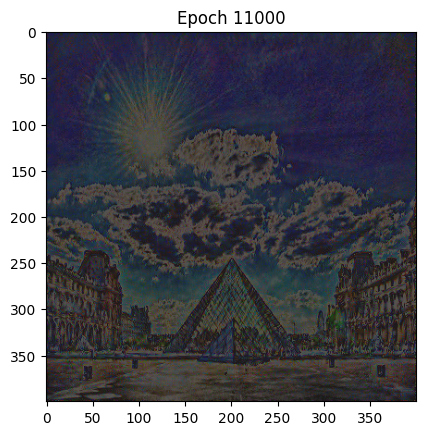

Epoch 12000, Total Cost: 0.0254


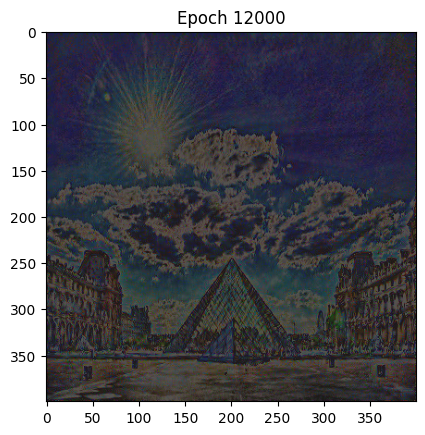

Epoch 13000, Total Cost: 0.0259


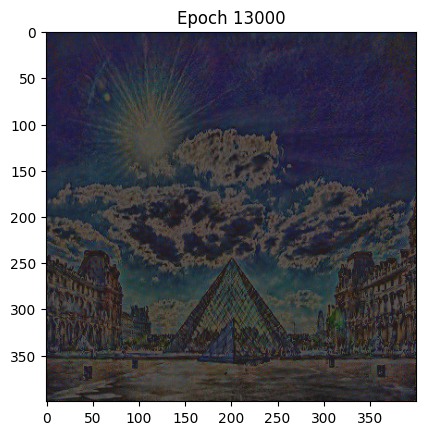

Epoch 14000, Total Cost: 0.0237


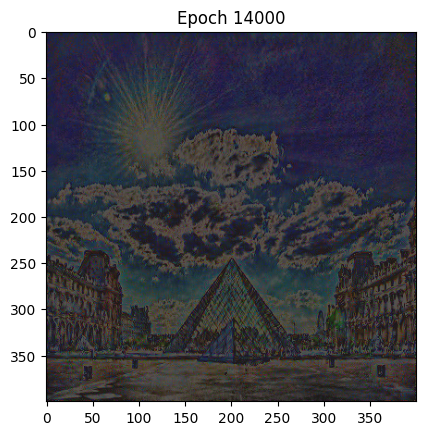

Epoch 15000, Total Cost: 0.0246


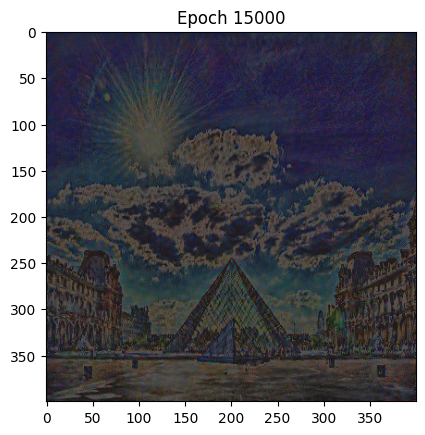

Epoch 16000, Total Cost: 0.0235


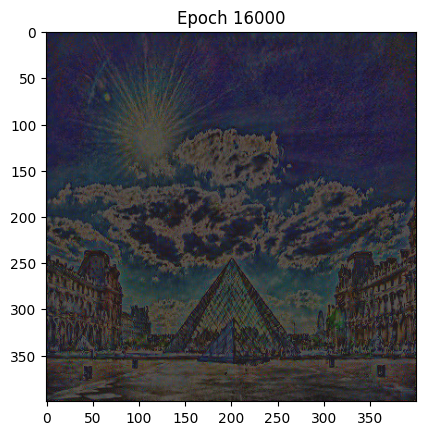

Epoch 17000, Total Cost: 0.0229


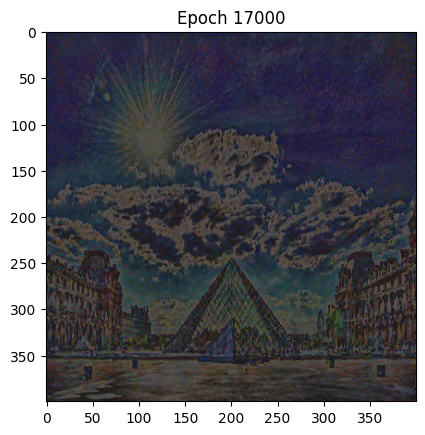

Epoch 18000, Total Cost: 0.0226


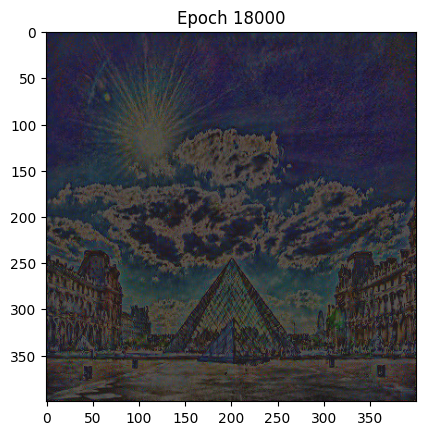

Epoch 19000, Total Cost: 0.0257


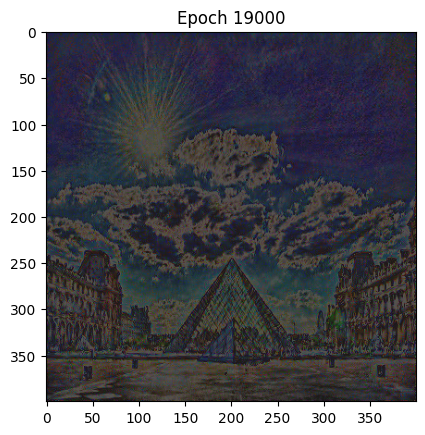

Epoch 20000, Total Cost: 0.0252


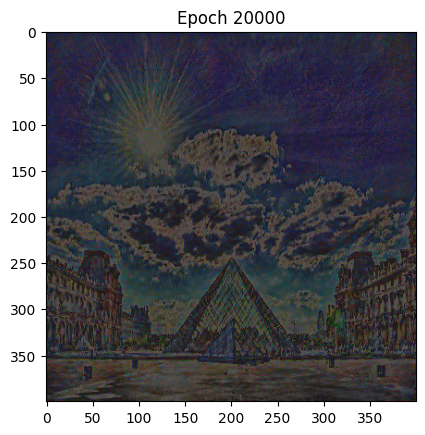

In [20]:
# Training loop
epochs = 20001
for epoch in range(epochs):
    optimizer.zero_grad()

    # Get generated image features
    content_extractor(generated_img)
    generated_content_features = content_extractor.outputs

    style_extractor(generated_img)
    generated_style_features = style_extractor.outputs

    # Compute costs
    content_cost = compute_content_cost(content_features['conv_4_2'], generated_content_features['conv_4_2'])
    style_cost = compute_style_cost(style_features, generated_style_features, style_weights)
    total_cost = alpha * content_cost + beta * style_cost

    # Backprop and optimize
    total_cost.backward()
    optimizer.step()

    # Clamp to valid pixel range
    with torch.no_grad():
        generated_img.clamp_(0, 1)

    # Display progress
    if epoch % 1000 == 0:
        print(f"Epoch {epoch}, Total Cost: {total_cost.item():.4f}")
        plt.imshow(tensor_to_image(generated_img))
        plt.title(f"Epoch {epoch}")
        plt.show()

---
## 6. Test and Visualize

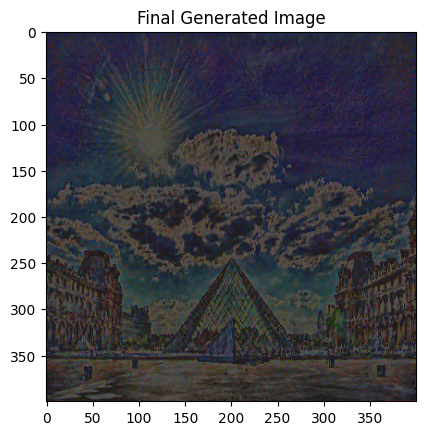

In [21]:
# Final result
final_img = tensor_to_image(generated_img)
plt.imshow(final_img)
plt.title("Final Generated Image")
plt.show()

# Save image4
# final_img.save("output/generated_image.png")

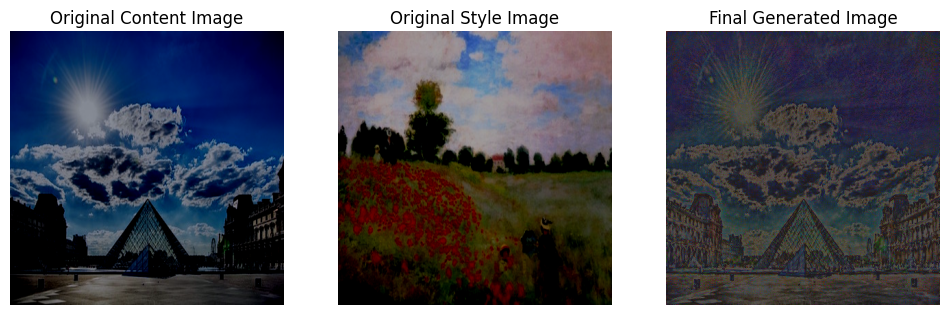

In [22]:
original_img = tensor_to_image(content_img)  # Original content image
final_img = tensor_to_image(generated_img)   # Final generated image
original_style = tensor_to_image(style_img)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 6))  # 1 row, 2 columns
ax1.imshow(original_img)
ax1.set_title("Original Content Image")
ax1.axis('off')

ax2.imshow(original_style)
ax2.set_title("Original Style Image")
ax2.axis('off')

ax3.imshow(final_img)
ax3.set_title("Final Generated Image")
ax3.axis('off')

plt.show()

---
## 7. Saving the model

In [24]:
from pathlib import Path

# Create model director path
MODEL_PATH = Path("output")
MODEL_PATH.mkdir(parents=True, exist_ok=True)

# Creat model save path
MODEL_NAME = "nst_state.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# Save the optimization state
state = {
    'generated_img': generated_img.detach().cpu(),  # Detach and move to CPU for saving
    'optimizer_state': optimizer.state_dict(),      # Optimizer state for resuming
    'epoch': epochs,                                # Last epoch completed
    'content_img': content_img.cpu(),               # Optional: save content image
    'style_img': style_img.cpu()                    # Optional: save style image
}

# Save the model state dict
print(f"MODEL_SAVE_PATH: {MODEL_SAVE_PATH}")
torch.save(obj=state,
           f=MODEL_SAVE_PATH)

MODEL_SAVE_PATH: output/nst_state.pth


In [25]:
# Save the final image
final_img.save("output/generated_image.png")